# TSP Using PuLP


In [1]:
import pulp
import numpy as np
import numpy.random as nr
import matplotlib.pyplot as plt
import pandas as pd
import time

from vcopt import vcopt

In [2]:
NO_TOWNS = 40 # NOTE THAT >= 45 CITIES WILL TAKE LONG TIME FOR PuLP to calculate
STARTING_TOWN = 0
nr.seed(1)

In [3]:
# function for creating town coordinates
def create_towns(NO_TOWNS):
    """generate random x and y coordinates for each town"""

    towns_x = nr.rand(NO_TOWNS) # x coordinates for NO_TOWNS number of towns
    towns_y = nr.rand(NO_TOWNS) # y coordinates for NO_TOWNS number of towns
    
    return np.array([towns_x, towns_y]).transpose()

towns = create_towns(NO_TOWNS) # generate coordinates for each town


In [4]:
# distances between towns

distances = np.zeros([NO_TOWNS, NO_TOWNS])
for i in range(NO_TOWNS):
    for j in range(NO_TOWNS):
        distance = ((towns[i][0] - towns[j][0])**2 + (towns[i][1] - towns[j][1])**2)**0.5
        distances[i][j] = distance

In [5]:
# define TSP

prob = pulp.LpProblem('TSP', pulp.LpMinimize)


In [6]:
# variables

# possible edges x(i->j)
x = pulp.LpVariable.dicts('x', ((i, j) for i in range(NO_TOWNS) for j in range(NO_TOWNS)), lowBound=0, upBound=1, cat='Binary')
# MTZ defined u variables
u = pulp.LpVariable.dicts('u', (i for i in range(NO_TOWNS)), lowBound=1, upBound=NO_TOWNS+1)

In [7]:
# objective_function

prob += pulp.lpSum(distances[i][j] * x[i, j] for i in range(NO_TOWNS) for j in range(NO_TOWNS))


In [8]:
# set constraints

for i in range(NO_TOWNS):
    prob += x[i, i] == 0 # cant visit itself
    
for i in range(NO_TOWNS):
    prob += pulp.lpSum(x[i, j] for j in range(NO_TOWNS)) == 1 # make sure that only one destination out from town i
    
for j in range(NO_TOWNS):
    prob += pulp.lpSum(x[i, j] for i in range(NO_TOWNS)) == 1 # make sure that each destination only gets one incoming town
    
    
# ensure that the towns are all connected in one path

for i in range(NO_TOWNS):
    for j in range(NO_TOWNS):
        if i != j and i != 0 and j != 0:
            prob += u[i] - u[j] <= NO_TOWNS * (1 - x[i, j]) - 1
            

In [9]:
%%time
start = time.time()
start2 = time.process_time()

status = prob.solve()

end = time.time()
end2 = time.process_time()

pulp_walltime = end - start
pulp_cputime = end2 - start2

CPU times: total: 15.6 ms
Wall time: 57 s


In [10]:
pulp.LpStatus[status]

'Optimal'

In [11]:
routes = [(i, j) for i in range(NO_TOWNS) for j in range(NO_TOWNS) if pulp.value(x[i, j]) == 1]

Text(0.5, 1.05, 'PuLP Optimisation\nRunning CPU Time: 0.015625s\nRunning Wall Time: 56.981s')

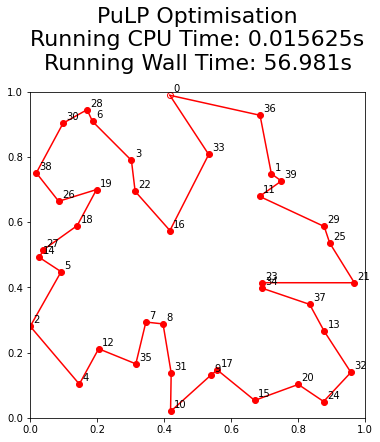

In [12]:
# visualise

plt.figure(figsize=(6, 6))

for i, row in enumerate(towns, 0):
    if i == STARTING_TOWN:
        plt.scatter(row[0], row[1], c='white', edgecolors='red')
    
    else:
        plt.scatter(row[0], row[1], c='red')
        
    plt.text(row[0]+0.01, row[1]+0.01, i)

for edge in routes:
    edge_x = [towns[edge[0]][0], towns[edge[1]][0]]
    edge_y = [towns[edge[0]][1], towns[edge[1]][1]]
    plt.plot(edge_x, edge_y, c='red')
    
plt.xlim([0, 1]); plt.ylim([0, 1])
plt.title(f'PuLP Optimisation\nRunning CPU Time: {pulp_cputime}s\nRunning Wall Time: {pulp_walltime:.3f}s', y=1.05, fontsize=22)


In [13]:
sum([distances[i][j]*pulp.value(x[i, j]) for i in range(NO_TOWNS) for j in range(NO_TOWNS)])

5.250669513107266

# TSP using vcopt

In [14]:
towns_x , towns_y = towns.transpose()[0], towns.transpose()[1]

start_town_x = towns_x[STARTING_TOWN]
start_town_y = towns_y[STARTING_TOWN]

path = np.arange(NO_TOWNS) # generate a random initial path that passes through all towns 
path = np.delete(path, np.where(path==STARTING_TOWN)) # remove the starting town from the path

In [15]:
# create scoring function for current path

def score_func(path):
    
    current_towns_x = towns_x[path][:-1]
    current_towns_y = towns_y[path][:-1]
    next_towns_x = towns_x[path][1:]
    next_towns_y = towns_y[path][1:]
    

    # add costs between each non-starting town according to path
    cost = sum(((towns_y[path][1:] - towns_y[path][:-1])**2 + (towns_x[path][1:] - towns_x[path][:-1])**2)**0.5)
    # add cost between first non-starting town and start town
    cost += ((towns_x[path][0] - start_town_x)**2 + (towns_y[path][0] - start_town_y)**2)**0.5 
    # add cost between last non-starting town and start town
    cost += ((towns_x[path][-1] - start_town_x)**2 + (towns_y[path][-1] - start_town_y)**2)**0.5
    
    return cost

In [16]:
# def plotting function for visualising paths at every step of optimisation


def tsp_show_pool(pool, **info):
    """function for visualising path at each generation"""
    # access the info dictionary provided by tspGA() function to get metrics

    
    gen = info['gen']
    best_index = info['best_index']
    best_score = info['best_score']
    mean_score = info['mean_score']
    mean_gap = info['mean_gap']
    time = info['time']
    
    
    plt.figure(figsize=(6, 6))
    
    # visualise some of the paths in each generation's population
    for para in pool[:10]:
        plt.plot(towns_x[para], towns_y[para], 'ok-', alpha=0.1)
    
    best_path_of_pool = np.concatenate(([STARTING_TOWN], pool[best_index], [STARTING_TOWN]))
    print(best_path_of_pool)
    plt.plot(towns_x[best_path_of_pool], towns_y[best_path_of_pool], 'or-')
    plt.plot(towns_x[STARTING_TOWN], towns_y[STARTING_TOWN], 'or', markerfacecolor='w') #indicate start position with X
    plt.xlabel('x'); plt.ylabel('y')
    
    for i, xy in enumerate(zip(towns_x, towns_y), 0):
        plt.text(xy[0]+0.01, xy[1]+0.01, s=i)
        
    plt.xlim([0, 1]); plt.ylim([0, 1])
    plt.title('gen={}, best={:.3f} mean={:.3f} time={:.3f}'.format(gen, best_score, mean_score, time))
    plt.show()


[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39]
________________________________________ info ________________________________________
para_range     : n=39
score_func     : <class 'function'>
aim            : ==0.0
show_pool_func : '<function tsp_show_pool at 0x00000227714F6200>'
seed           : 69
pool_num       : 20
max_gen        : None
core_num       : 1 (*vcopt, vc-grendel)
_______________________________________ start ________________________________________
Scoring first gen 20/20        
Mini 2-opting first gen 20/20        
[ 0  2 30 13  8 34 17  1  9 10  4 28 19 38 16 22 39 29 33 35 18 15 23 24
  5 14 27 12  6 32 26 20 37 31  3  7 21 25 36 11  0]


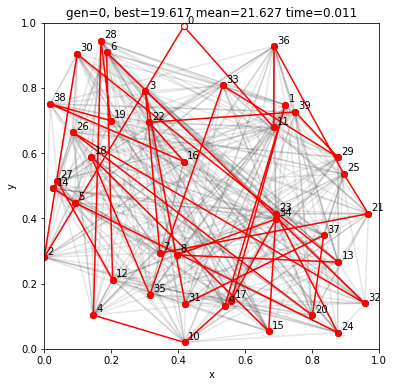

[ 0 37 10 18 14 13  7  9 20 31 11 29 21 30 26 36  6  8 34 24 19  5 23 15
 38  2 27 22  3 17 12 25 32 39  1 16  4 35 33 28  0]


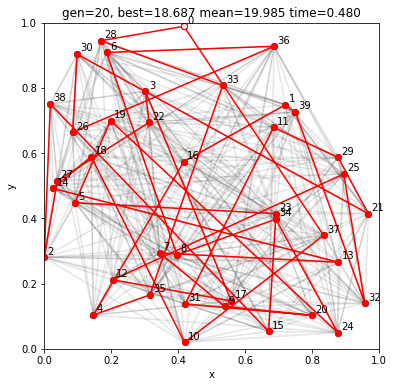

[ 0 37 22 26  3 38 19  4 34  1 36 33 20 24  7 32 21 28  8  2 27 30  5 15
 17 23 13 25 18 10  6 11 35  9 14 31 12 29 39 16  0]


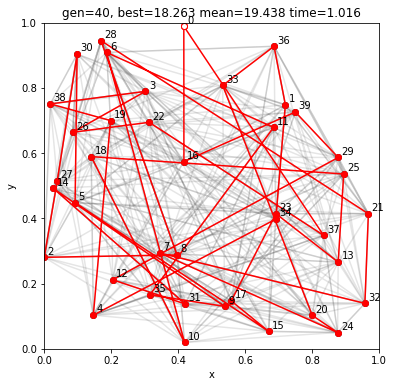

[ 0 30  5 16 15 32 23 20 17 34 38 25  1 36  6 22 39 14 12 10 24 29  2 35
  4 11 13  7 18 37 19  3 27 28 26 21 31  8  9 33  0]


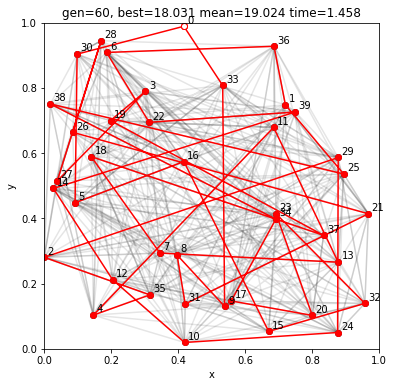

[ 0 30 29 31 17 10 36 32  7 16 38 18 19 28  6 34 25  4 15  9 24 12 20 35
  1 11 33  5  3 21 37 22 26  8 14  2 27 23 13 39  0]


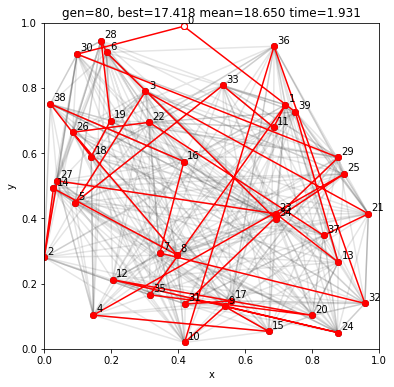

[ 0 37 28 21 32  7 24 20 33 36  1 34  4 19 38  3 26 22  8  2 27 30  5 15
 17 23 13 25 39 29 12 14 31  9 35 11  6 10 18 16  0]


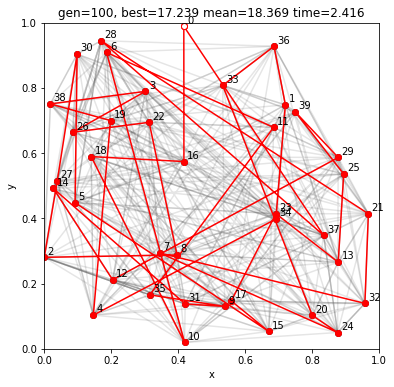

[ 0 20 15 28  1 39 36 14 17  8 24 23 16 35 26 30 22 37  4 12 10 13  9  7
 31 38  3  6 27 18 34 11 25 29 32 19  2  5 21 33  0]


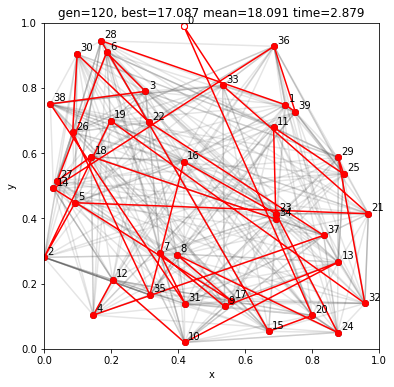

[ 0 37 24 32 20  7 22 34 25 29 18 19 10  2 30 38  3 12 27 14 13  1 23 33
 39 21 36 35 17  4  5 28  6 31  9  8 26 16 11 15  0]


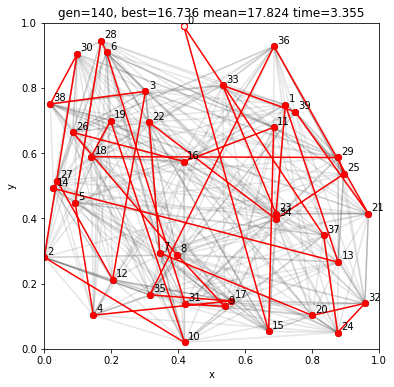

[ 0 37 24 32 20  7 22 34 25 29 18 19 10  2 30 38  3 12 27 14 13  1 23 33
 39 21 36 35 17  4  5 15 11 16 26  8  9 31  6 28  0]


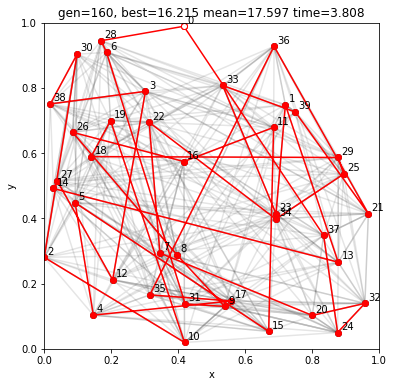

[ 0 37 24 32 20  7 22 34 25 29 18 19 35 36 21 39 33 23  1 13 14 27 12  3
 38 30  2 10 17  4  5 15 11 16 26  8  9 31  6 28  0]


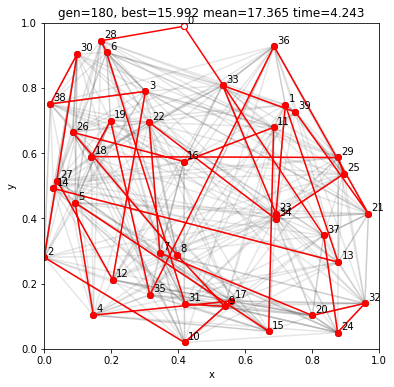

[ 0 37 24 32 20  7 22 34 25 29 18 19 35 13  1 23 33 39 21 36 14 27 12  3
 38 30  2 10 17  4  5 15 11 16 26  8  9 31  6 28  0]


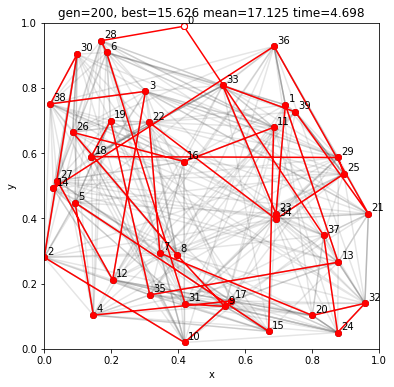

[ 0 27 14  5  1  9 15 23 37 20 32  6 18 10  4 28 30  2 31 24 13  8 34 17
 19 38 16 22 39 29 33 35 12  7  3 26 21 25 36 11  0]


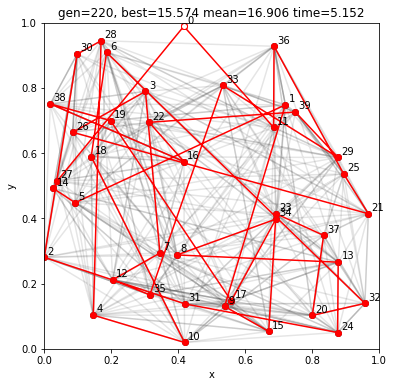

[ 0 27 14  5  1  9 15 23 37 20 32  6 18 10  4 28 30  2 31 24 13  8 34 17
 19 38 16 22 39 29 33 35 12  7 11 36 25 21 26  3  0]


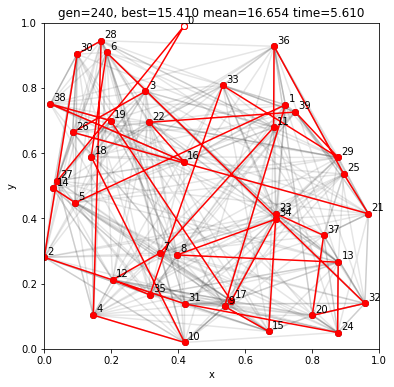

[ 0 37 24 32 20  7 16 11 15  5  4 17 10  2 30 38 19 14 27 12  3 35 13  1
 23 33 39 21 36 18 29 25 34 22 26  8  9 31  6 28  0]


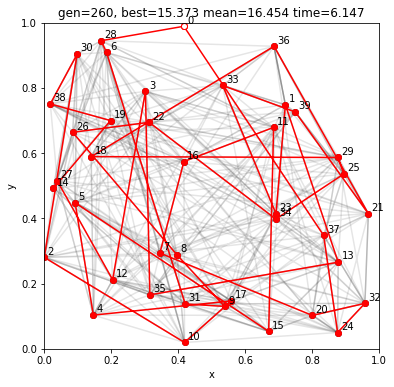

[ 0 37 24 32 20  7 16 11 15  5  4 17 10  2 30 38 19 14 27 12  3 35 13  1
 23 33 39 21 31  9  8 26 22 34 25 29 18 36  6 28  0]


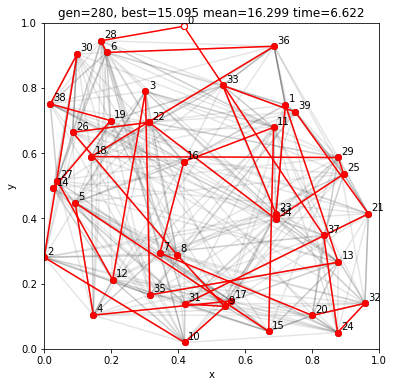

[ 0 37 24 32 20  7 16 11 15  5  4 17 10  2 30 38 19  8  9 31 21 39 33 23
  1 13 35  3 12 27 14 26 22 34 25 29 18 36  6 28  0]


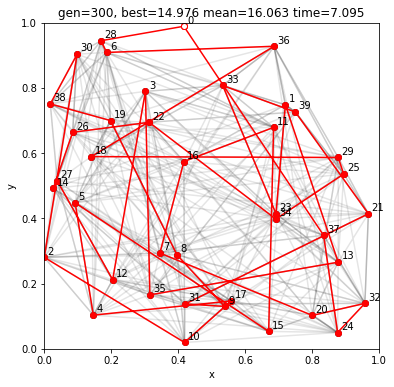

[ 0 37 24 32 20  7 16 11 15  5  4 17 10  2 30 38 19  8  9 31 21 39 33 23
  1 13 35  3 12 27 14 26 18 29 25 34 22 36  6 28  0]


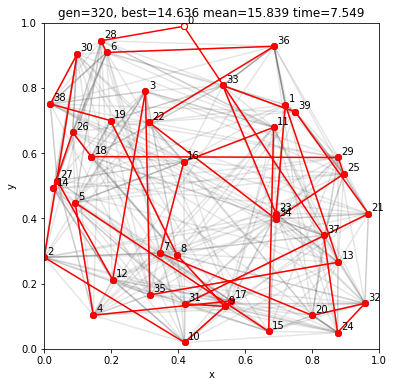

[ 0 37 24 32 20  7 34 25 29 18 26 14 27 12  3 35 13  1 23 33 39 21 31  9
  8 19 38 30  2 10 17  4  5 15 11 16 22 36  6 28  0]


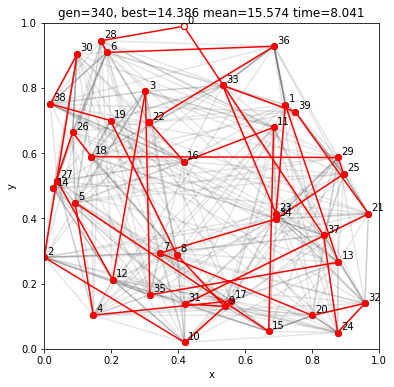

[ 0 37 24 32 21 39 33 23  1 13 35  3 12 27 14 26 18 29 25 34  7 20 31  9
  8 19 38 30  2 10 17  4  5 15 11 16 22 36  6 28  0]


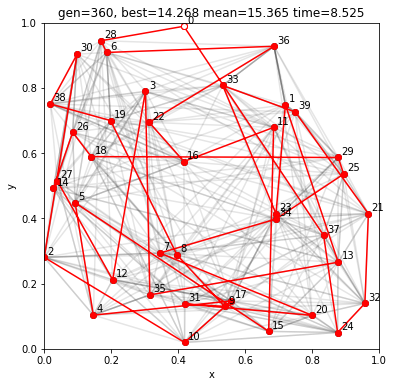

[ 0 37 24 32 21 39 33 23  1 13 35  3  8  9 31 20  7 34 25 29 18 26 14 27
 12 19 38 30  2 10 17  4  5 15 11 16 22 36  6 28  0]


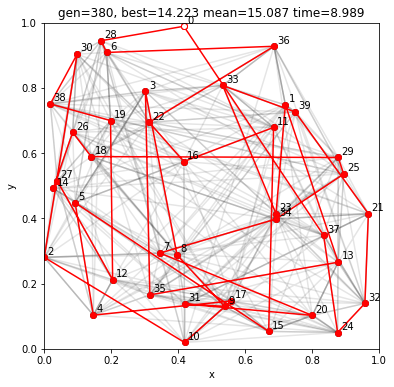

[ 0 37 24 32 15  5  4 17 10  2 30 38 19 12 27 14 26 18 29 25 34  7 20 31
  9  8  3 35 13  1 23 33 39 21 11 16 22 36  6 28  0]


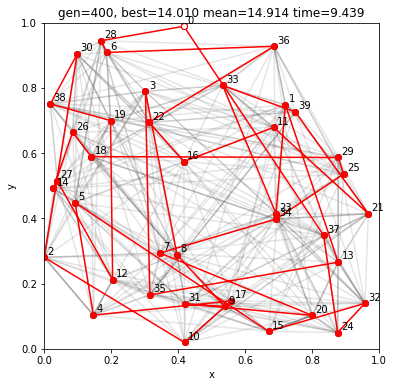

[ 0 37 24 32 15  5  4 17 10  2 30 38 19 12 27 14 26 18 29 25 34  3  8  9
 31 20  7 35 13  1 23 33 39 21 11 16 22 36  6 28  0]


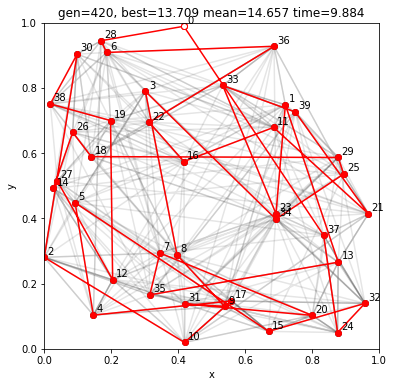

[ 0 16 35  4  8 18 30  1 39 36 14 28  6  3 38 26 12 15 20 23 24 34 11 25
 29 13 37 17 10 22 21 32 31  5 27  2 19  7  9 33  0]


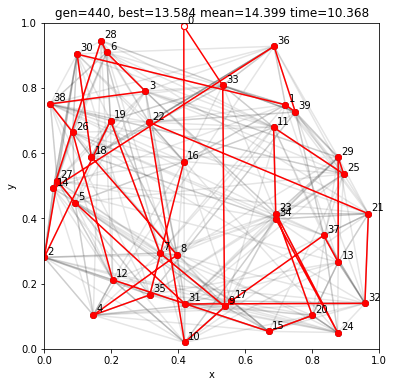

[ 0 37 32 25 21 12 17 15 13 24 34 23 10 18  5 20  9  7  8  6 19 14 31 11
 16 27  2 35  4 38 30 26 36 29  1 39 33 22  3 28  0]


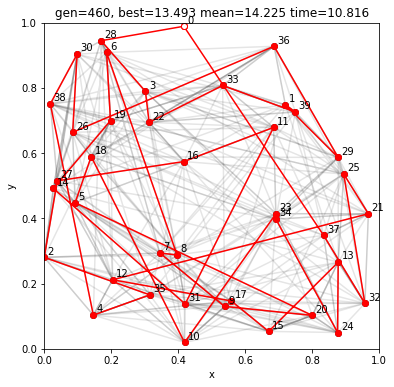

[ 0 39 38  3 19 37 18  7 13 11 35  4  2  5 16 22 14 12 10 17  9 15 20 23
 32 24 29 36  1 25 34 21 31  8 26  6 28 27 30 33  0]


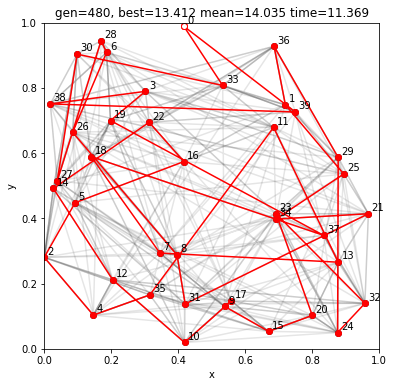

[ 0 37 32 34 29 25 21 19 16 18 30 28 11  6 10  8  4 27  2  7 24 20 13 23
 39 33 36  1 12 14  5 15 17  9 35 31  3 38 26 22  0]


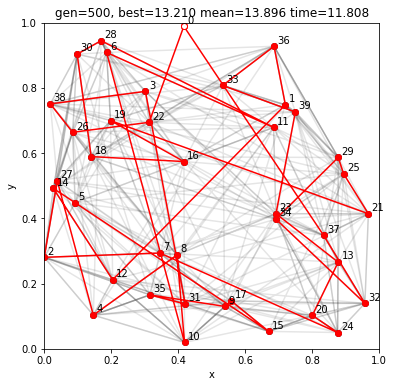

[ 0 11 30 26 34 31 10 17 15 32 29 23 24 20 13 21 25 35 12  5 27  3 39  1
 14  2  4  7  9 18 37  8 19 33 36 22 16 38  6 28  0]


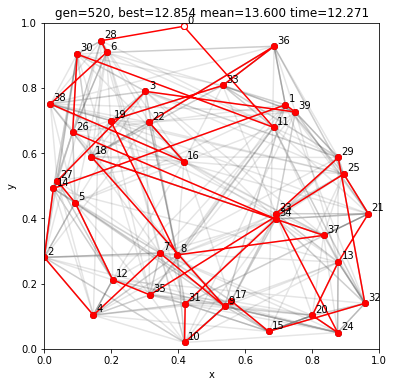

[ 0 16 35  4  8  7  9 31 32 21 22 10 17 13 37 25 29 11 34 24 23 20 15 12
 26 38  3  6 28 14 36 39  1 30 18 19 27  2  5 33  0]


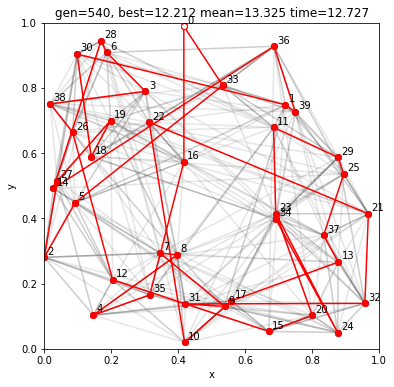

[ 0 16 35  4  8  7  9 31 32 21 22 10 17 13 37 25 29 11 34 24 23 20 15 12
 26 38  3  1 39 36 14 28  6 30 18 19 27  2  5 33  0]


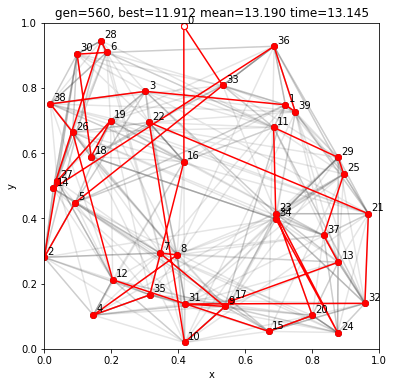

[ 0 16 35 15 20 23 24 34 11 29 25 37 13 17 10 22 21 32 31  9  7  8  4 12
 26 38  3  1 39 36 14 28  6 30 18 19 27  2  5 33  0]


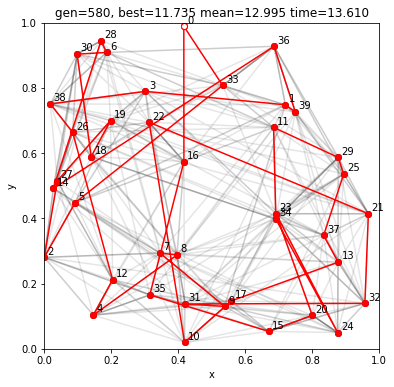

[ 0 11 18  5 37 16 19 26  4 35  2 27 14 31 10 23 34 24 13 15 17 12 38 30
  6  8  7  9 20 32 25 21 36 29  1 39 33 22  3 28  0]


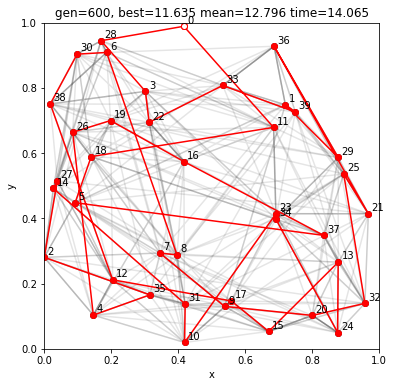

[ 0 11 18  5 37 16 19 26  4 35  2 27 14 31 10 23 34 24 13 15 17 12 38 30
  6  8  7  9 20 32 25 21 36 29 39  1 33 22  3 28  0]


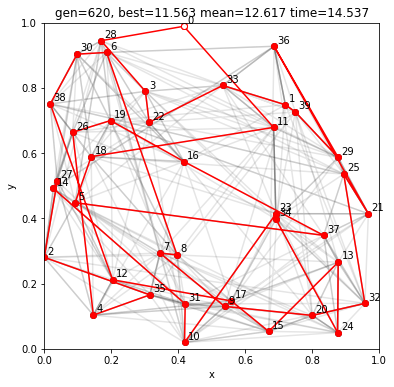

[ 0 11 18  5 37 16 19 26  4 35  2 27 14  6 30 38 12 17 15 13 24 34 23 10
 31  8  7  9 20 32 25 21 36 29 39  1 33 22  3 28  0]


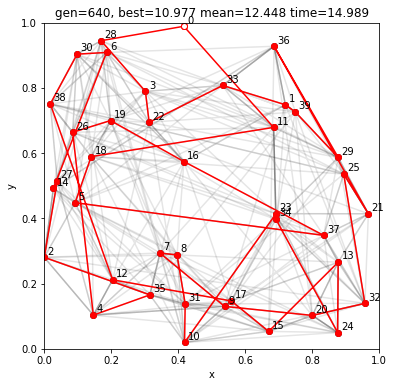

[ 0  6 38 16 22 18 26 21 25 36 33 29 39  1  5 14 27 28 30  3 19 35  2  7
 12  4 10  8 17 34 23 37 20 15 31  9 24 13 32 11  0]


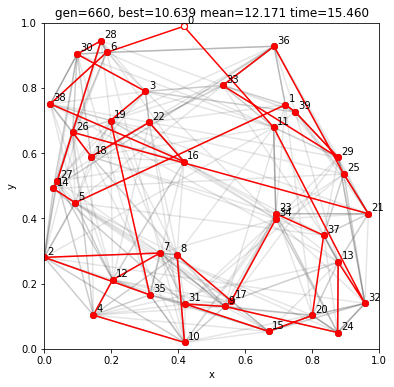

[ 0  6 38 16 22 18 26 21 25 36 33 29 39  1  5 14 27 28 30  3 19 35  2 10
  4 12  7  8 17 34 23 37 20 15 31  9 24 13 32 11  0]


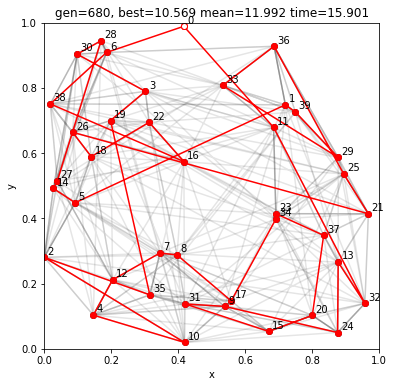

[ 0  6  3 30 28 27 14  5  1 39 29 33 36 25 21 26 18 22 16 38 19 35  2 10
  4 12  7  8 17 34 23 37 20 15 31  9 24 13 32 11  0]


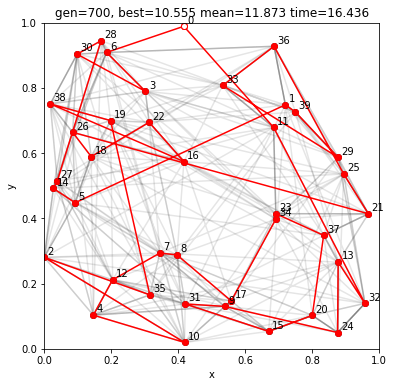

[ 0  6  3 30 28 27 14  5  1 36 33 29 39 25 21 26 18 22 16 38 19 35  2 10
  4 12  7  8 17 34 23 37 20 15 31  9 24 13 32 11  0]


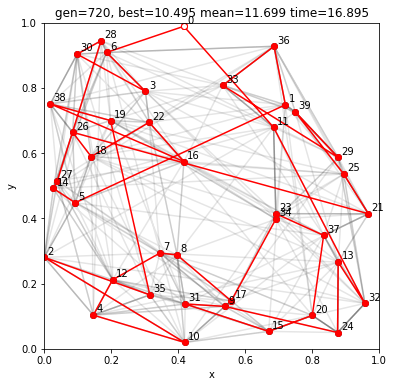

[ 0  6  3 30 28 27 14  5  1 36 33 29 39 25 21 26 18 22 16 38 19 35  2 10
  4 12  7  8 17 34 23 32 13 24  9 31 15 20 37 11  0]


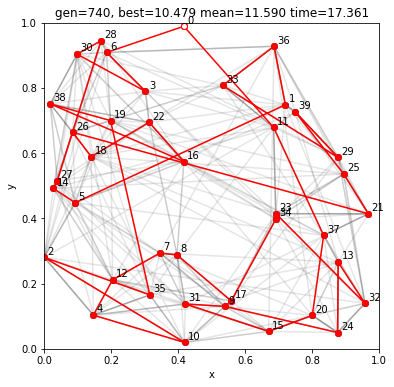

[ 0  6  3 30 28 27 14  5  1 36 33 29 39 25 23 34 17  8  7 12  4 10  2 35
 19 38 16 22 18 26 21 32 13 24  9 31 15 20 37 11  0]


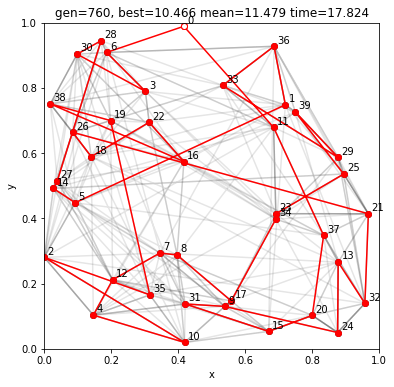

[ 0  6  3 30 28 27 14  5  1 11 37 20 15 31  9 24 13 32 21 26 18 22 16 38
 19 35  2 10  4 12  7  8 17 34 23 25 39 29 33 36  0]


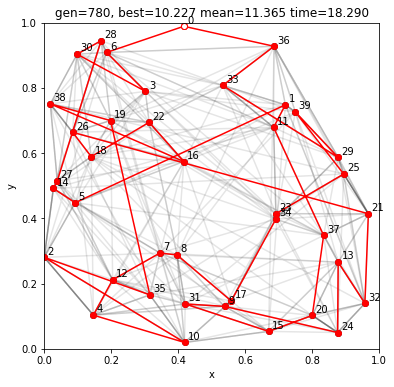

[ 0  6  3 30 28 27 14  5  1 11 37 20 15 31  9 24 13 32 21 26 18 22 16 38
 19 35 10  2  4 12  7  8 17 34 23 25 39 29 33 36  0]


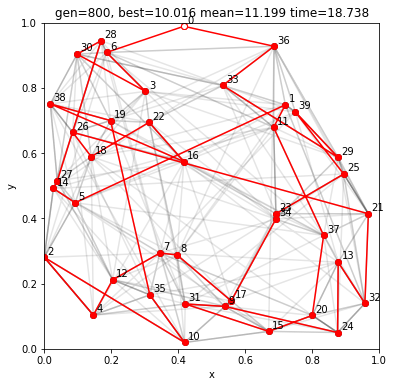

[ 0 16 22 18 26 21 32 13 24  9 31 15 20 37 11  1  5 14 27 28 30  3  6 38
 19 35 10  2  4 12  7  8 17 34 23 25 39 29 33 36  0]


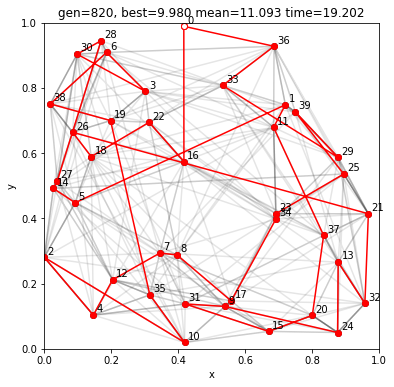

[ 0 16 22 18 26 21 32 13 24  9 31 15 20 37 11  1  5 14 27 28 30  3  6 38
 19 35 10  2  4 12  7  8 17 34 23 25 39 29 36 33  0]


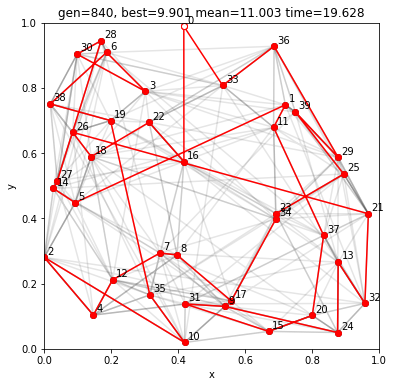

[ 0 16 22 18 26 21 32 13 24  9 31 15 20 37 11  1  5 14 27 28 30  3  6 38
 19 35  8  7 12  4  2 10 17 34 23 25 39 29 36 33  0]


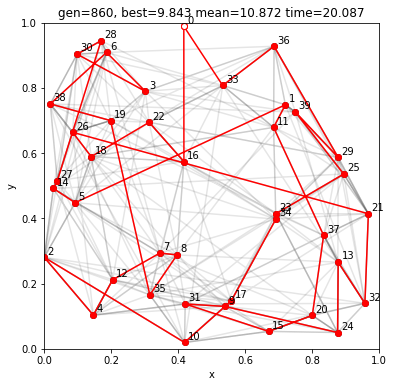

[ 0  6 28 30 14 27  5 18 26 22 19 33 36 29 21 32 24 20 15  9 17 35 10  4
  2  7 12 23 13 31 25 34 39  1 11 37 16  8 38  3  0]


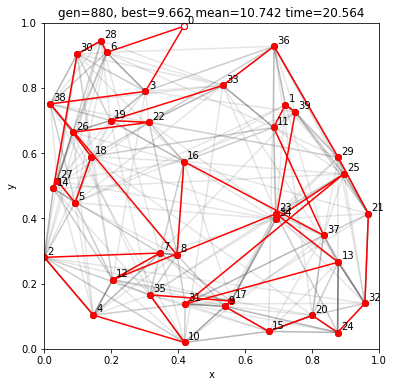

[ 0  6 28 30 14 27  5 18 26 22 19 33 36 29 21 32 24 20 13 23 12  7  2  4
 10 35 17  9 15 31 25 34 39  1 11 37 16  8 38  3  0]


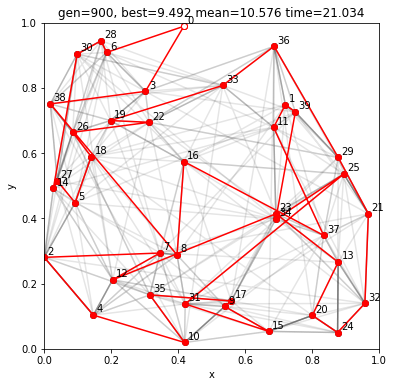

[ 0  6 28 30 14 27  5 18 26 22 19 33 36 29 21 32 24 20 13 23 12  7  2  4
 10 15  9 17 35 31 25 34 39  1 11 37 16  8 38  3  0]


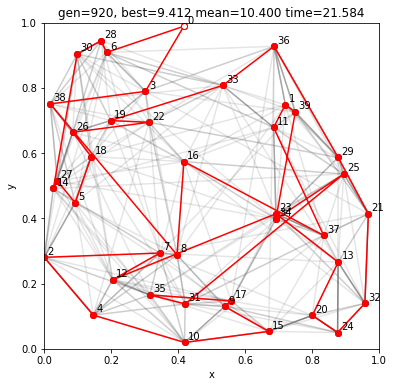

[ 0  6 28 30 14 27  5 18 26 22 19 33 36 29 21 32 24 20 13 37 11  1 39 34
 25 31 35 17  9 15 10  4  2  7 12 23 16  8 38  3  0]


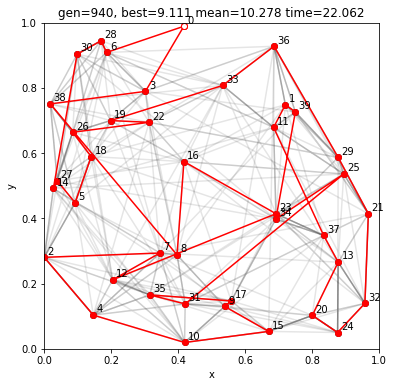

[ 0  6 28 30 14 27  5 18 26 22 19 33 36 29 21 32 24 20 13 37 11  1 39 34
 25 31 35 17  9 15 10  4  2 16 23 12  7  8 38  3  0]


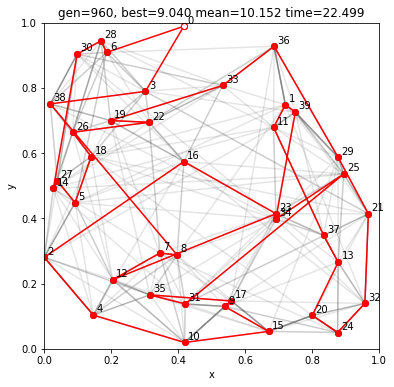

[ 0  6 28 30 14 27  5 18 26  2  4 10 15  9 17 35 31 25 34 39  1 11 37 13
 20 24 32 21 29 36 33 19 22 16 23 12  7  8 38  3  0]


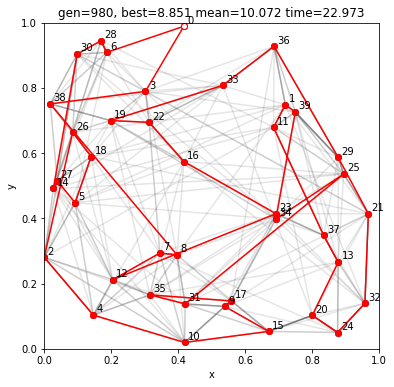

[ 0  6 28 30 14 27  5 18 26  2  4 10 15 17  9 35 31 25 34 39  1 11 37 13
 20 24 32 21 29 36 33 19 22 16 23 12  7  8 38  3  0]


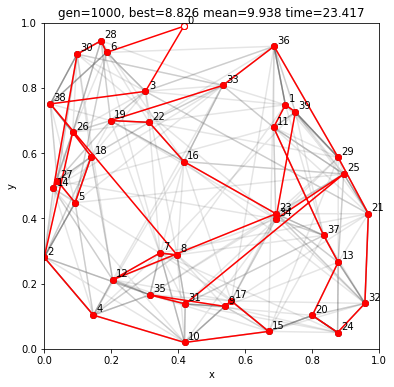

[ 0  6 28 30 14 27  5 18 26  2  4 10 15 17  9 35 31 25 34 39  1 11 37 13
 20 24 32 21 29 36 33  8  7 12 23 16 22 19 38  3  0]


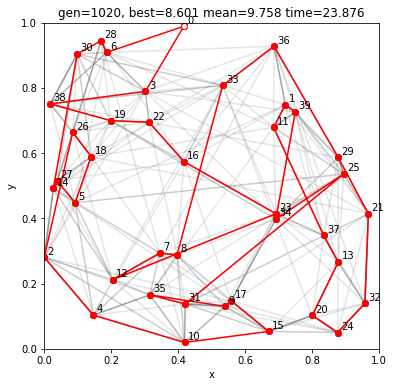

[ 0 35  4  2  5 27 14 12  7  8 10 31  9 17 15 32 24 20 13 25 21 37 29 39
  1 36  6  3 18 22 19 28 26 38 30 33 16 23 34 11  0]


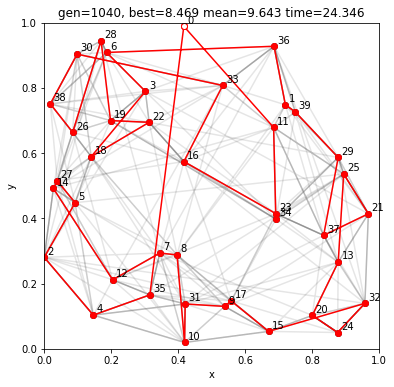

[ 0 35  4  2  5 27 14 12  7  8 31 10  9 17 15 32 24 20 13 25 21 37 29 39
  1 36  6  3 18 22 19 28 26 38 30 33 16 23 34 11  0]


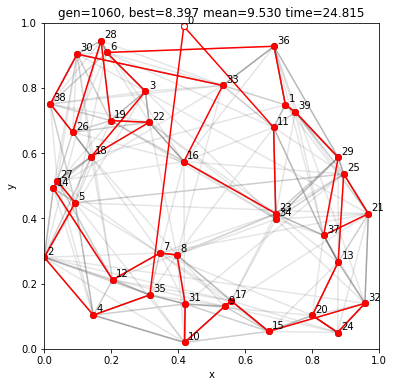

[ 0 35  4  2  5 27 14 12  7  8 31 10  9 17 15 32 24 20 13 25 21 37 29 39
  1 36  6 28 19 22 18  3 26 38 30 33 16 23 34 11  0]


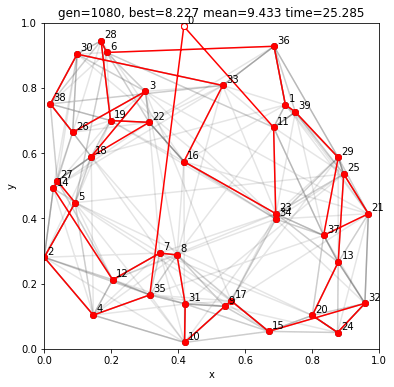

[ 0 28  6 36  1 39 29 37 21 25 13 20 24 32 15 17  9 10 31  8  7 12 14 27
  5  2  4 35 19 22 18  3 26 38 30 33 16 23 34 11  0]


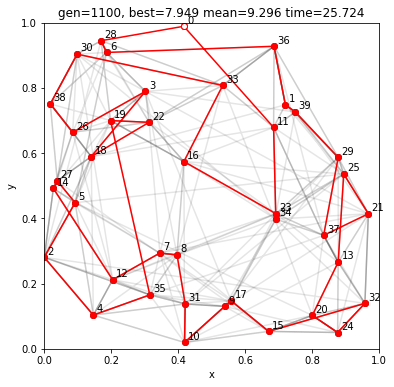

[ 0 28  6 36  1 39 29 37 21 25 13 20 24 32 15 17  9 10 31  8  7 12 14 27
  5  2  4 35 19 22 18  3 26 38 30 11 34 23 16 33  0]


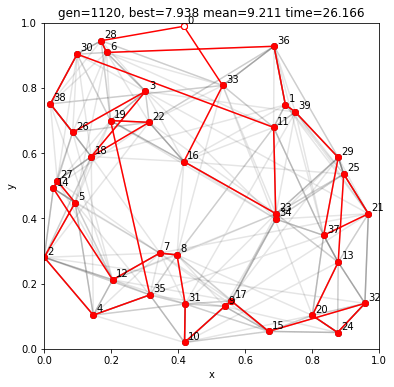

[ 0 28 30 38 26  3 18 22 19 35  4  2  5 27 14 12  7  8 31 10  9 17 15 32
 24 20 13 25 21 37 29 39  1 36  6 11 34 23 16 33  0]


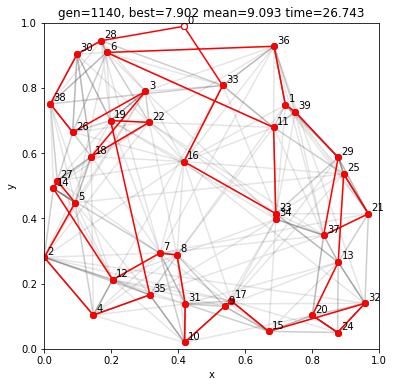

[ 0  6 28 30 38 26 27 14  5  2  4 10 15 17  9 35 12  7  8 33 36 29 25 34
 21 32 24 20 13 37 11  1 39 31 23 16 22 19 18  3  0]


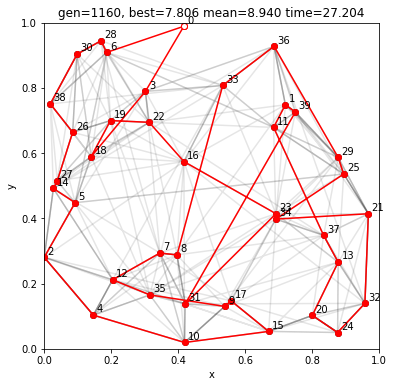

[ 0  6 28 30 38 26 27 14  5  2  4 10 15 17  9 35 12  7  8 33 36 29 25 37
 13 20 24 32 21 34 11  1 39 31 23 16 22 19 18  3  0]


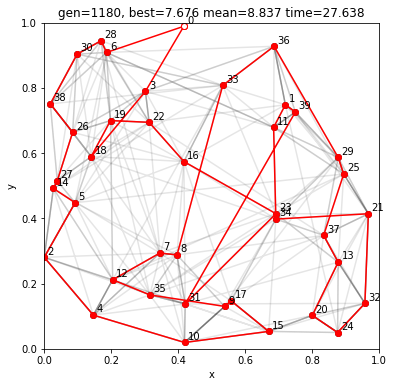

[ 0  6 28 30 38 26 27 14  5  2  4 10 15 17  9 39  1 11 34 21 32 24 20 13
 37 25 29 36 33  8  7 12 35 31 23 16 22 19 18  3  0]


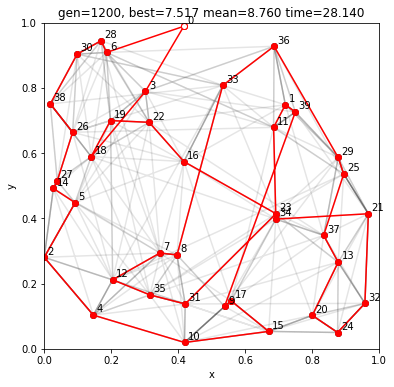

[ 0  6 28 30 38 26 27 14  5  2  4 10 15 17  9 20 24 32 21 34 11  1 39 13
 37 25 29 36 33  8  7 12 35 31 23 16 22 19 18  3  0]


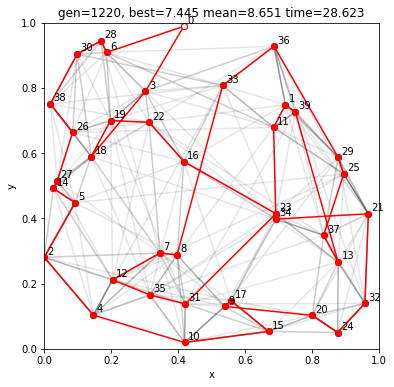

[ 0 16 22 26 18  5 35  4 31  9 10 17 34 23 19  3  6 28 30 38 27 14  2 12
  7  8 20 15 24 32 21 13 37 25 29 11 39  1 36 33  0]


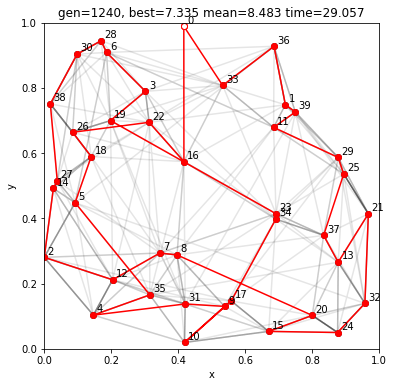

[ 0 28 30  6 11 39  1 36  3 26 38 18 19 22 14 27  5  2  4 35 12  7  8 31
 10  9 17 15 32 24 20 13 25 21 29 37 34 23 16 33  0]


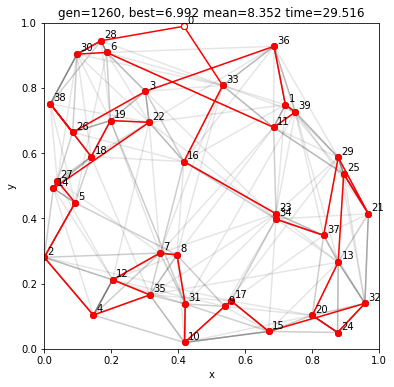

[ 0 28 30  6 11 39  1 36  3 26 38 18 22 19 14 27  5  2  4 35 12  7  8 31
 10  9 17 15 32 24 20 13 25 21 29 37 34 23 16 33  0]


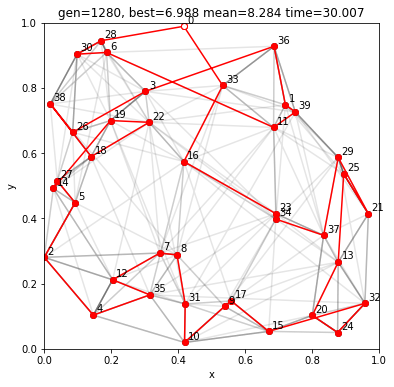

[ 0  3 22 30 26 19  7  8 31 35 16 33 36 11  1 39 29 25 21 13 32 24 20 15
 34 23 37 17  9 10  4 12  2 14 27  5 18 38  6 28  0]


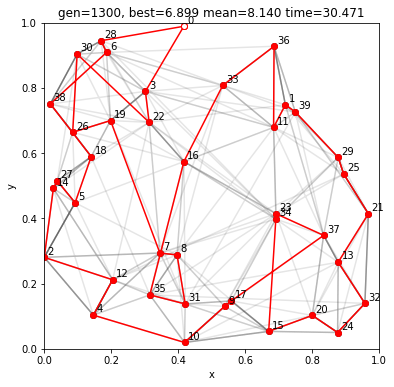

[ 0  3 22 30 26 19  7 35 31  8 16 33 36 11  1 39 29 25 21 13 32 24 20 15
 34 23 37 17  9 10  4 12  2 14 27  5 18 38  6 28  0]


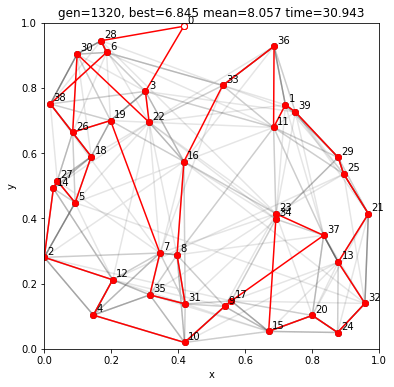

[ 0  3 22 30 26 19  7 35 31  8 16 33 36 39  1 11 29 25 21 13 32 24 20 15
 34 23 37 17  9 10  4 12  2 14 27  5 18 38  6 28  0]


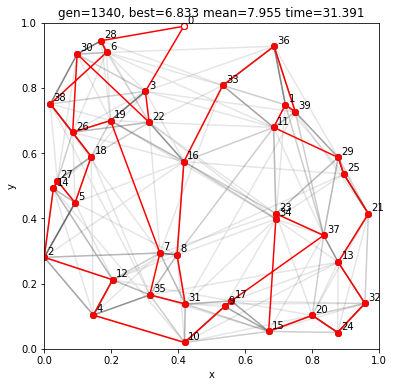

[ 0 22 26 18 14 27 38 30 28  6  3 19 16 23 34 17  9 10 31 35  4  5  2 12
  7  8 20 15 24 32 37 13 21 25 29 11 39  1 36 33  0]


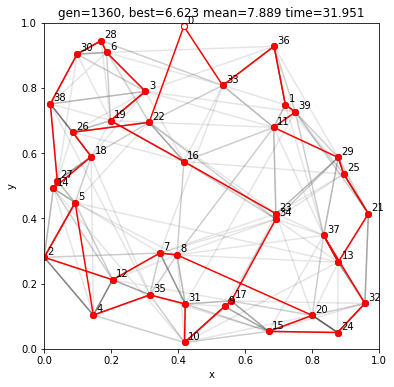

[ 0  6 28 30 38 27 14 18 26 22  3 19 16 23 34 17  9 10 31 35  4  5  2 12
  7  8 20 15 24 32 37 13 21 25 29 11 39  1 36 33  0]


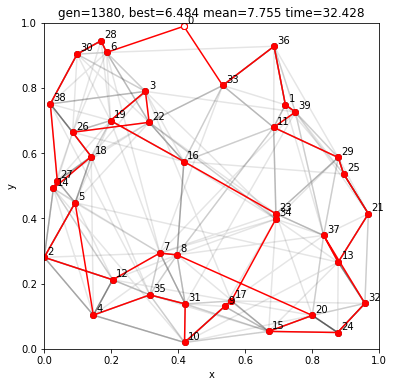

[ 0  6 28 30 38 27 14 18 26 22  3 19 16 23 34 17  9 10 31 35  4  2  5 12
  7  8 20 15 24 32 37 13 21 25 29 11 39  1 36 33  0]


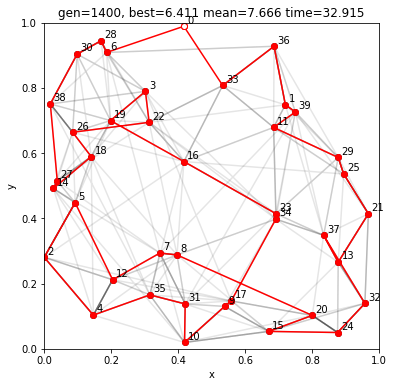

[ 0  6 28 30 38 27 14 18 26 22  3 19 16 23 34  8  7 12  5  2  4 35 31 10
  9 17 20 15 24 32 37 13 21 25 29 11 39  1 36 33  0]


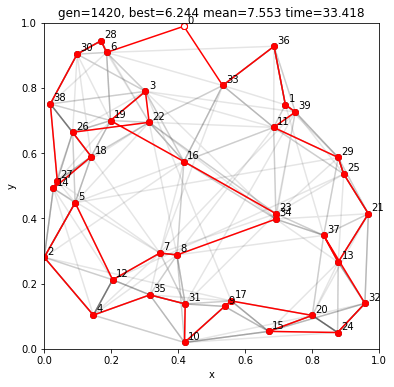

[ 0 28 30  6 19 26  3 22 18 38 27 14  5  2  4 35 12  7  8 31 10  9 17 15
 32 24 20 13 37 21 29 25 23 34 16 11 39  1 36 33  0]


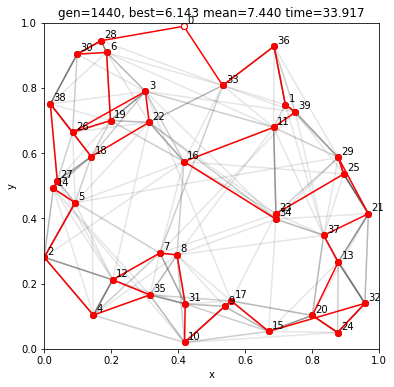

[ 0  3  6 28 30 38 26 19 18 27 14  5  2  4 12 35 31  8  7 16 23 34 17  9
 10 15 20 24 32 13 37 21 25 29 11 39  1 22 33 36  0]


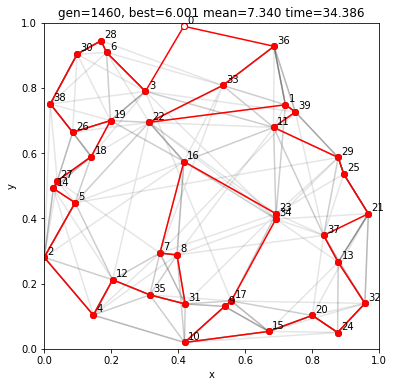

[ 0  3  6 28 30 38 26 19 18 27 14  5  2  4 12 35 31  8  7 16 23 34 17  9
 10 15 20 24 32 13 37 21 25 29  1 39 11 22 33 36  0]


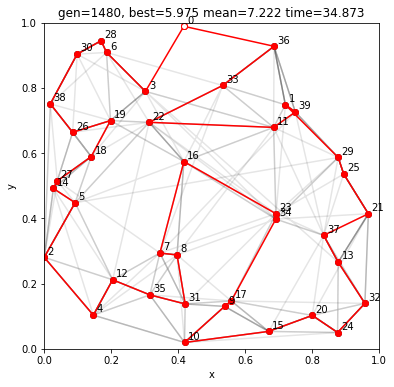

[ 0 28 30  6  3 22 18 26 19 38 27 14  5  2  4 12 35  7  8 31 10  9 17 15
 32 24 20 13 37 21 29 25 23 34 16 11 39  1 36 33  0]


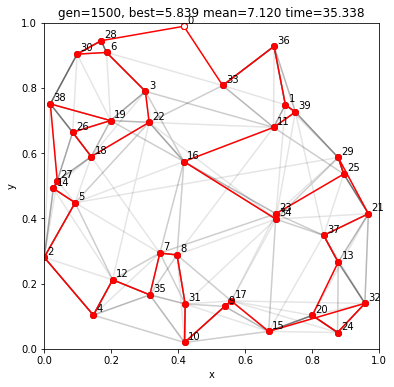

[ 0 28 30  6  3 22 18 26 38 19 27 14  5  2  4 12 35  7  8 31 10  9 17 15
 32 24 20 13 37 21 29 25 23 34 16 11 39  1 36 33  0]


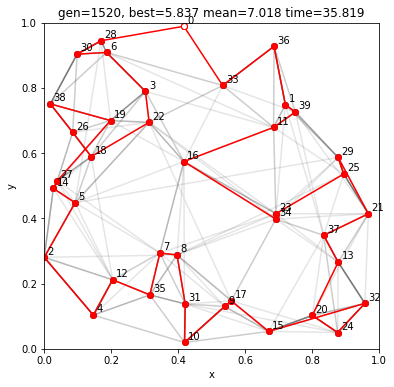

[ 0 28 30  6  3 22 19 38 26 18 27 14  5  2  4 12 35  7  8 31 10  9 17 15
 32 24 20 13 37 21 29 25 23 34 16 11 39  1 36 33  0]


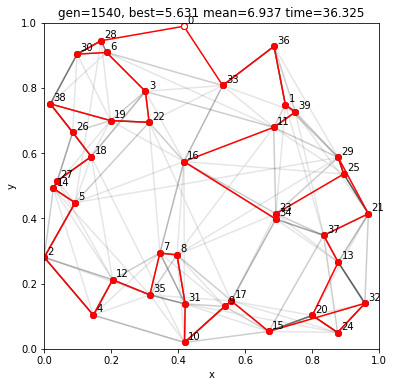

[ 0 33 36  1 39 11 16 34 23 25 29 21 37 13 20 24 32 15 17  9 10 31  8  7
 35 12  4  2  5 14 27 18 26 38 19 22  3  6 30 28  0]


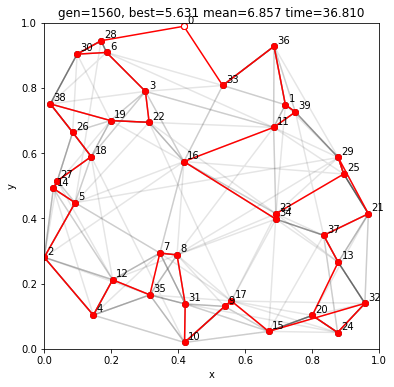

[ 0 33 36  1 39 11 16 34 23 25 29 21 37 13 20 32 24 15 17  9 10 31  8  7
 35 12  4  2  5 14 27 18 26 38 19 22  3  6 30 28  0]


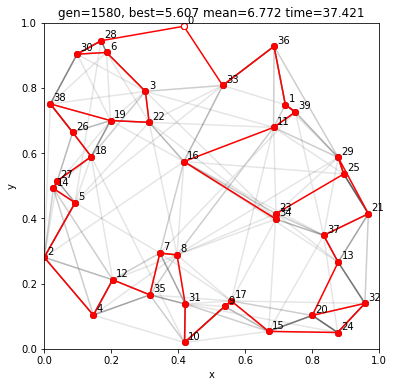

[ 0 33 36  1 39 11 16 34 23 29 25 21 37 13 20 32 24 15 17  9 10 31  8  7
 35 12  4  2  5 14 27 18 26 38 19 22  3  6 30 28  0]


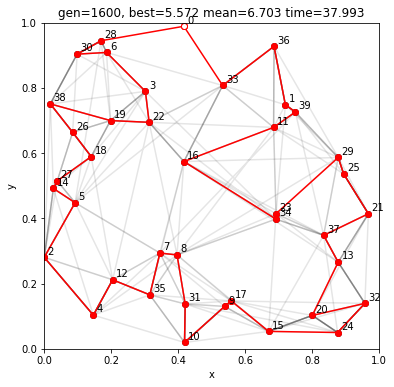

[ 0 33 36  1 39 11 16 34 23 29 25 21 37 13 24 32 20 15 17  9 10 31  8  7
 35 12  4  2  5 14 27 18 26 38 19 22  3  6 30 28  0]


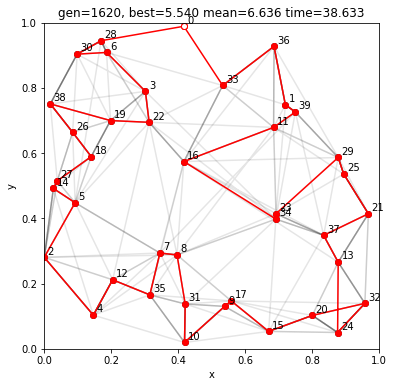

[ 0 33 36  1 39 11 16 34 23 29 25 21 37 13 32 24 20 15 17  9 10 31  8  7
 35 12  4  2  5 14 27 18 26 38 19 22  3  6 30 28  0]


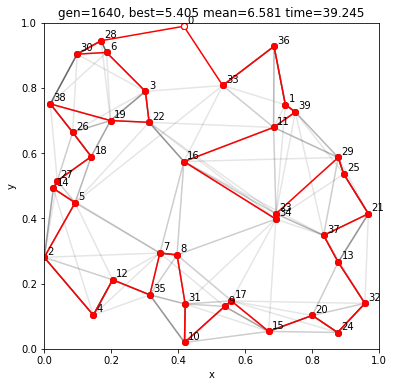

[ 0 33 36  1 39 11 16 34 23 29 25 21 37 13 32 24 20 15 17  9 10 31  8  7
 35 12  4  2  5 14 27 18 26 38 19 22  3  6 30 28  0]


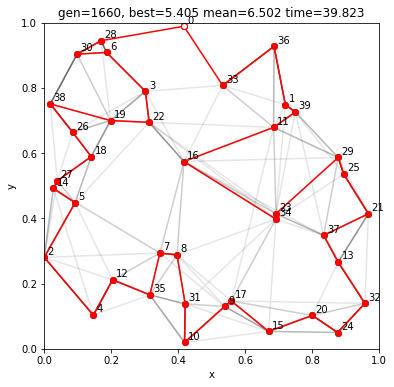

[ 0 33 36  1 39 11 16 34 23 29 25 21 37 13 32 24 20 15 17  9 10 31  8  7
 35 12  4  2  5 14 27 18 26 38 19 22  3  6 30 28  0]


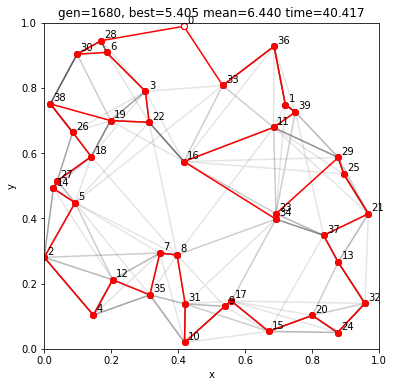

[ 0 33 36  1 39 11 16 34 23 29 25 21 37 13 32 24 20 15 17  9 10 31  8  7
 35 12  4  2  5 14 27 18 26 38 19 22  3  6 30 28  0]


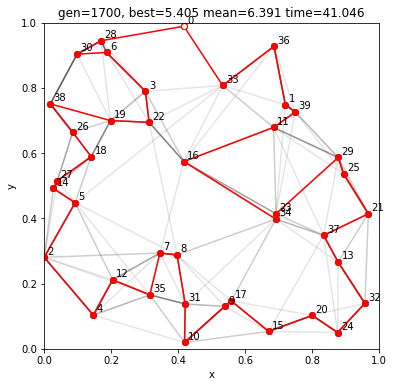

[ 0 33 36  1 39 11 16 34 23 29 25 21 37 13 32 24 20 15 17  9 10 31  8  7
 35 12  4  2  5 14 27 18 26 38 19 22  3  6 30 28  0]


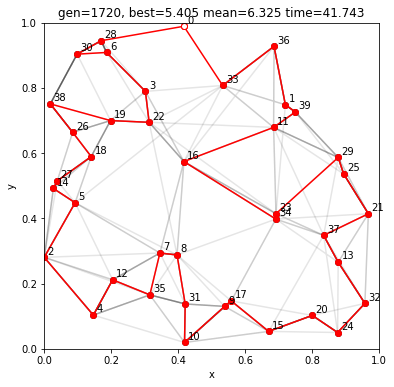

[ 0 33 36  1 39 11 16 34 23 29 25 21 37 13 32 24 20 15 17  9 10 31  8  7
 35 12  4  2  5 14 27 18 26 38 19 22  3  6 30 28  0]


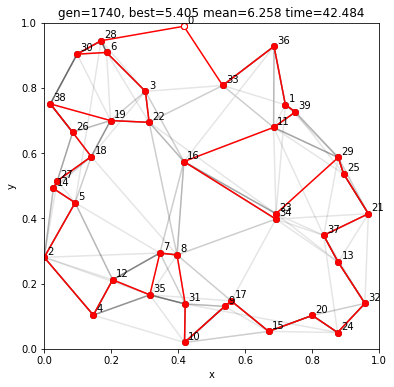

[ 0 33 36  1 39 11 16 34 23 29 25 21 37 13 32 24 20 15 17  9 10 31  8  7
 35 12  4  2  5 14 27 18 26 38 19 22  3  6 30 28  0]


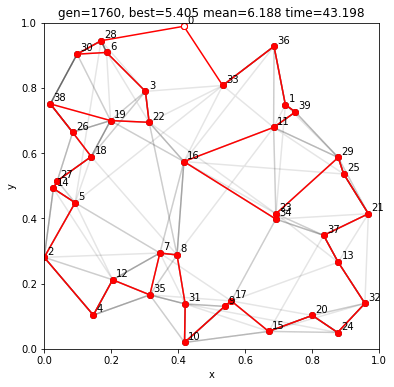

[ 0 33 36  1 39 11 16 34 23 29 25 21 37 13 32 24 20 15 17  9 10 31  8  7
 35 12  4  2  5 14 27 18 26 38 19 22  3  6 30 28  0]


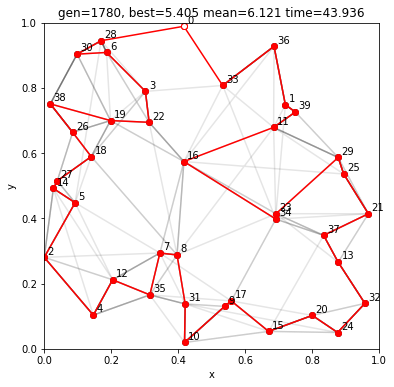

[ 0 33 36  1 39 11 16 34 23 29 25 21 37 13 32 24 20 15 17  9 10 31  8  7
 35 12  4  2  5 14 27 18 26 38 19 22  3  6 30 28  0]


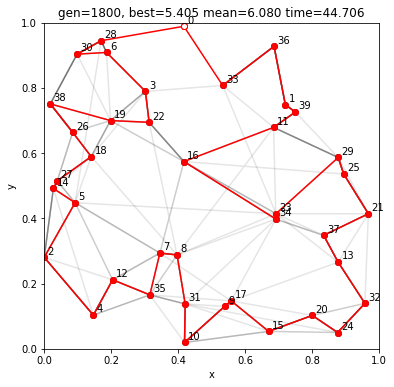

[ 0 33 36  1 39 11 16 34 23 29 25 21 37 13 32 24 20 15 17  9 10 31  8  7
 35 12  4  2  5 14 27 18 26 38 19 22  3  6 30 28  0]


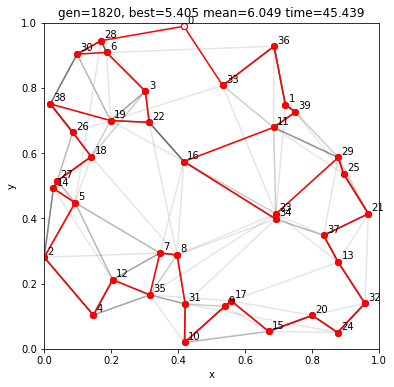

[ 0 33 36  1 39 11 16 34 23 29 25 21 37 13 32 24 20 15 17  9 10 31  8  7
 35 12  4  2  5 14 27 18 26 38 19 22  3  6 30 28  0]


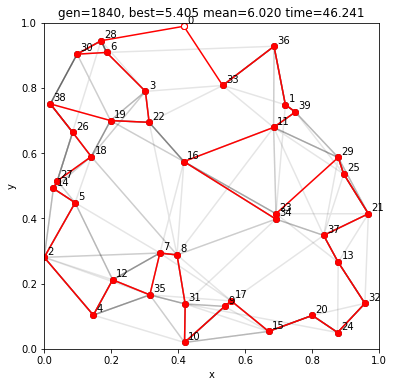

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


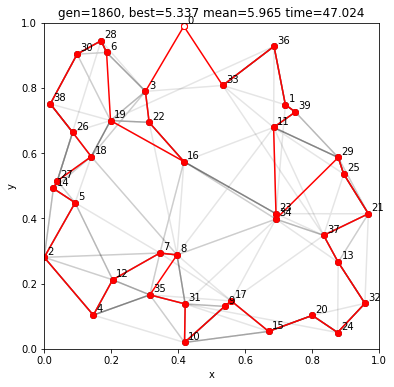

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


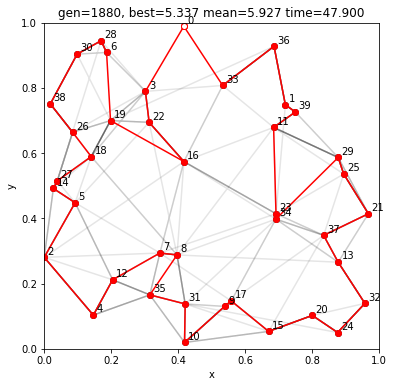

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


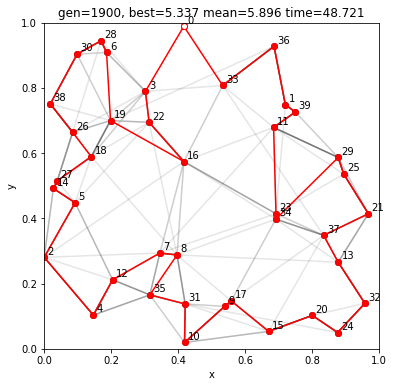

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


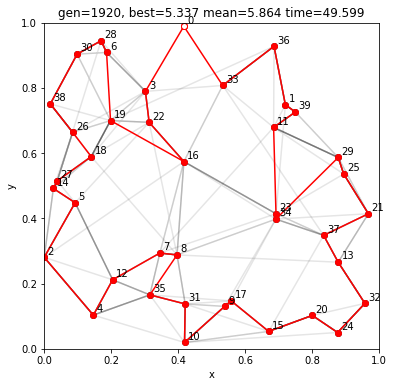

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


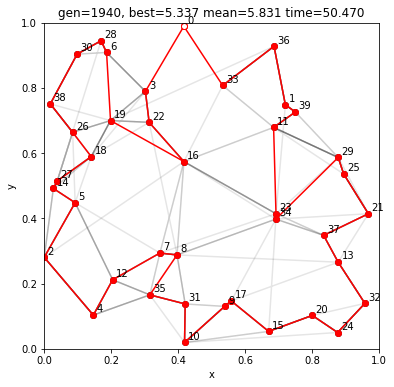

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


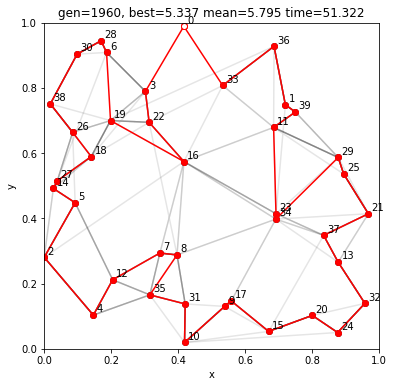

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


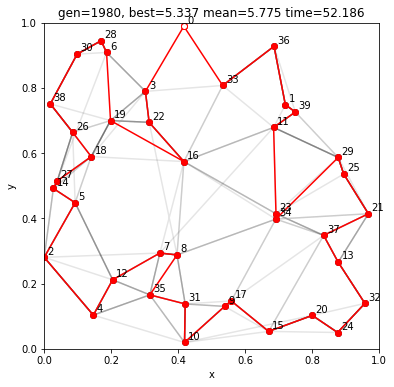

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


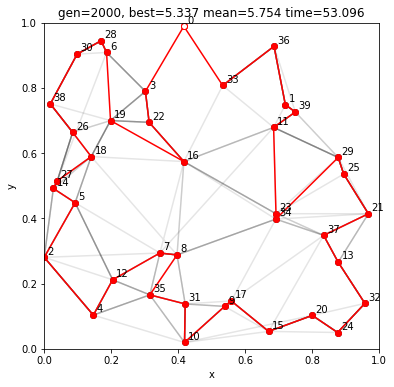

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


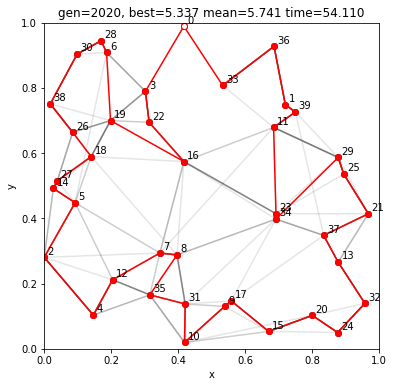

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


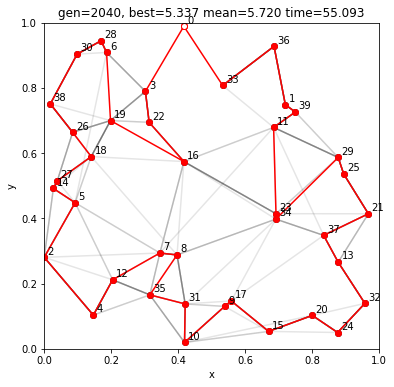

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


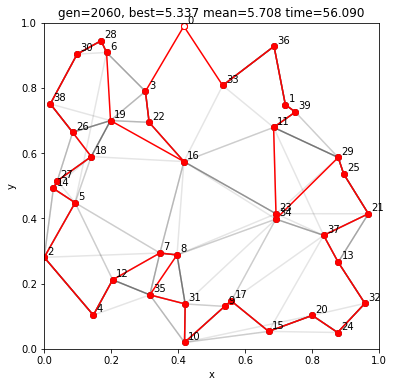

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


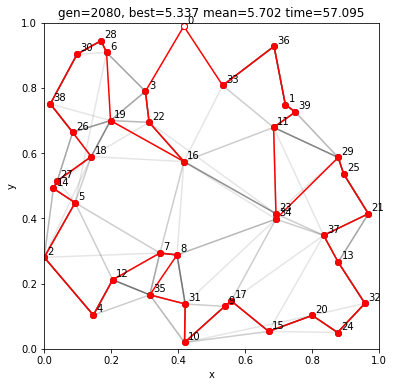

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


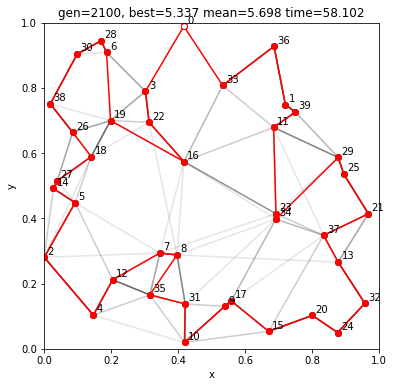

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


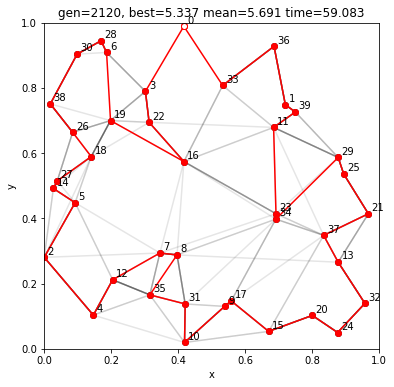

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


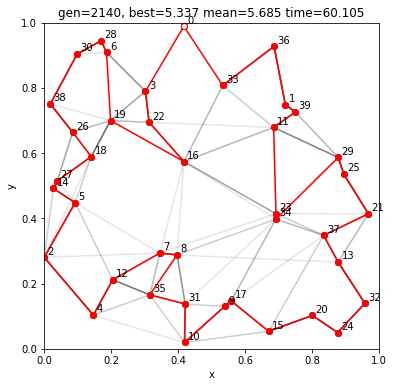

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


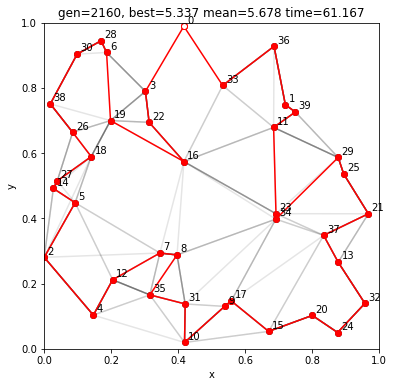

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


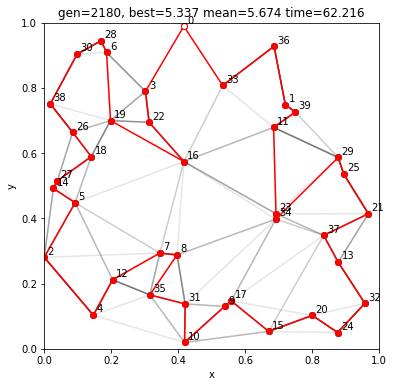

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


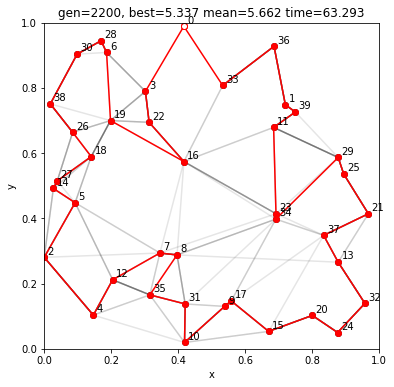

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


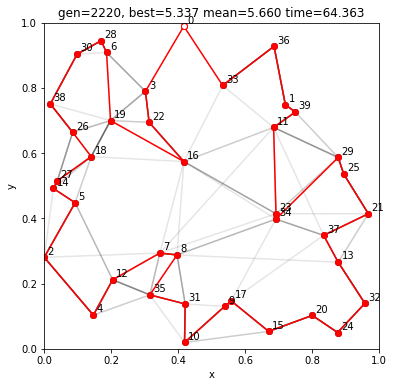

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


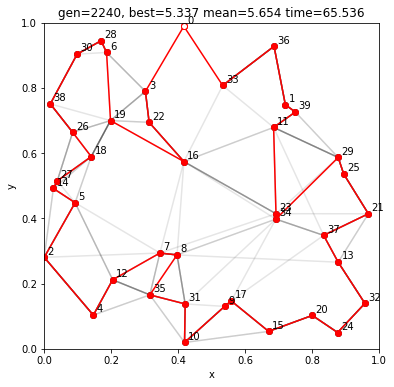

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


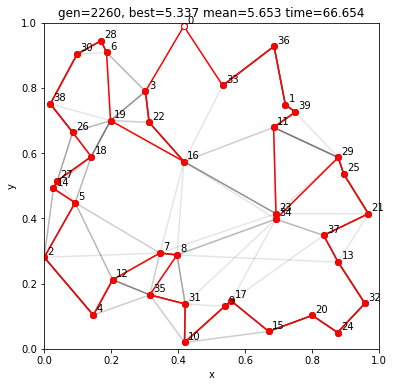

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


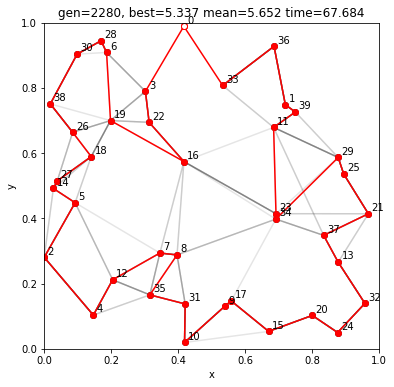

[ 0 33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7
 12  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3  0]


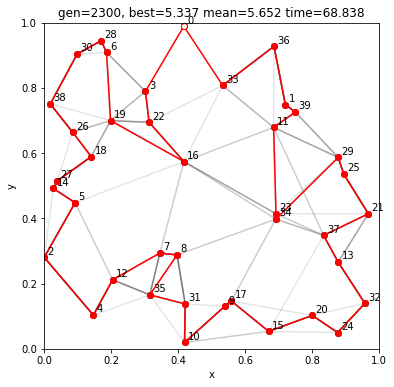

_______________________________________ result _______________________________________
para = np.array([33, 36, 1, 39, 11, 23, 34, 29, 25, 21, 37, 13, 32, 24, 20, 15, 17, 9, 10, 31, 35, 8, 7, 12, 4, 2, 5, 14, 27, 18, 26, 38, 30, 28, 6, 19, 16, 22, 3])
score = 5.336918329220172
________________________________________ end _________________________________________
[33 36  1 39 11 23 34 29 25 21 37 13 32 24 20 15 17  9 10 31 35  8  7 12
  4  2  5 14 27 18 26 38 30 28  6 19 16 22  3]
5.336918329220172
CPU times: total: 1min 8s
Wall time: 1min 9s


In [17]:
%%time

print(path)

start = time.time()
start2 = time.process_time()

para, score = vcopt().tspGA(path,
                            score_func,
                            0, # we want to minimise our score which measures total distance
                            show_pool_func=tsp_show_pool,
                            pool_num=20,
                            seed=69,
                            ) 

end = time.time()
end2 = time.process_time()


vcopt_walltime = end - start
vcopt_cputime = end2 - start2

print(para)
print(score)

Text(0.5, 1.05, 'vcopt Optimisation\nRunning CPU Time: 68.65625s\nRunning Wall Time: 69.029s')

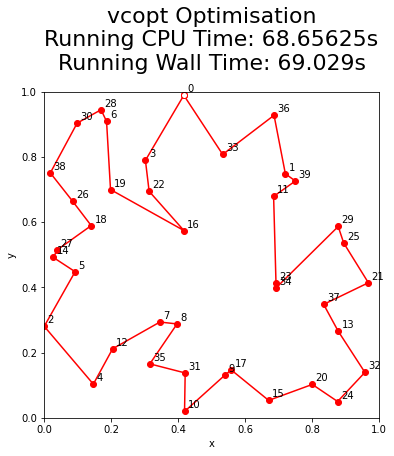

In [18]:
plt.figure(figsize=(6, 6))

best_path = np.concatenate(([STARTING_TOWN], para, [STARTING_TOWN]))

plt.plot(towns_x[best_path], towns_y[best_path], 'or-')
plt.plot(towns_x[STARTING_TOWN], towns_y[STARTING_TOWN], 'or', markerfacecolor='w') #indicate start position with X
plt.xlabel('x'); plt.ylabel('y')

for i, xy in enumerate(zip(towns_x, towns_y), 0):
    plt.text(xy[0]+0.01, xy[1]+0.01, s=i)

plt.xlim([0, 1]); plt.ylim([0, 1])
plt.title(f'vcopt Optimisation\nRunning CPU Time: {vcopt_cputime}s\nRunning Wall Time: {vcopt_walltime:.3f}s', y=1.05, fontsize=22)


([<matplotlib.axis.XTick at 0x22771a73310>,
 [Text(1, 0, 'wall time'), Text(2, 0, 'cpu time')])

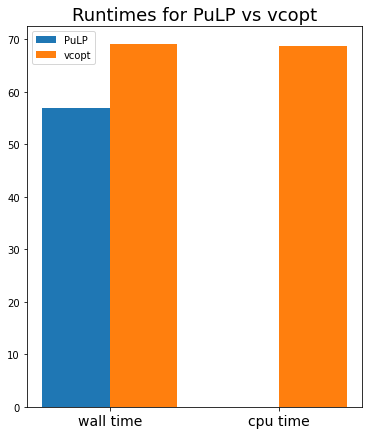

In [19]:
x = [i-0.2 for i in range(1, 3)]
x2 = [(i+0.2) for i in range(1, 3)]

plt.figure(figsize=(6, 7))
plt.bar(x, [pulp_walltime, pulp_cputime], 0.4, label='PuLP')
plt.bar(x2, [vcopt_walltime, vcopt_cputime], 0.4, label='vcopt')

plt.title('Runtimes for PuLP vs vcopt', fontsize=18)
plt.legend()
plt.xticks([i for i in range(1, 3)], ['wall time', 'cpu time'], fontsize=14)